# ADL

**De las 'n' variables del dataset, LDA extrae las p <= n nuevas variables independientes que separan la mayoria de clases de la variable dependiente **

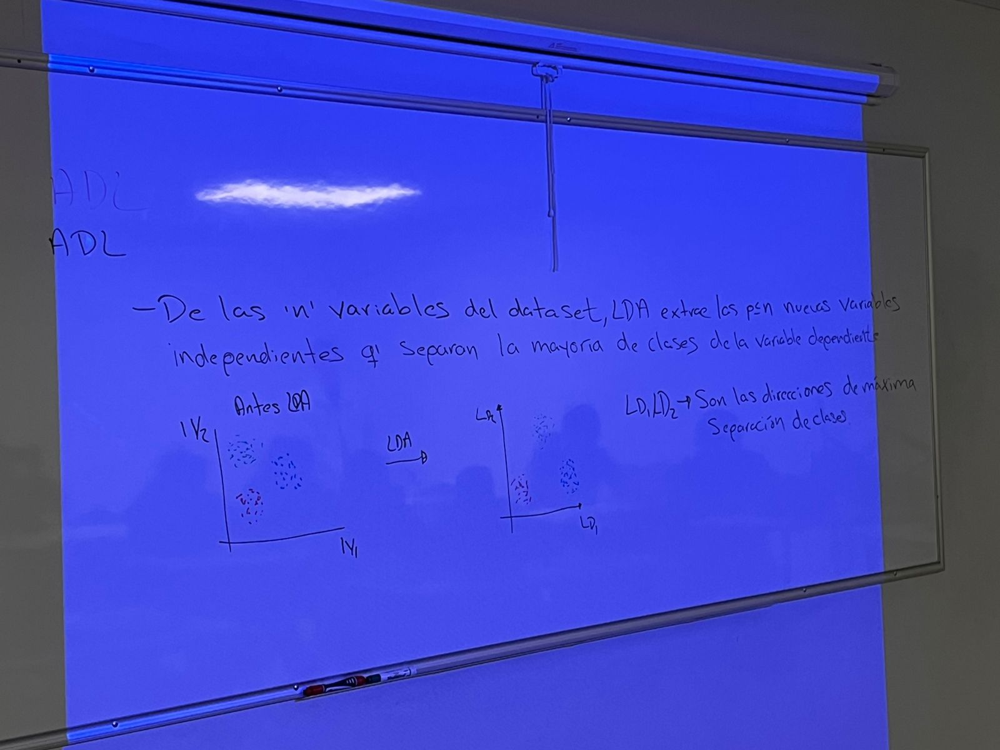

1.- Aplicar escalado de variables a la mtriz de caracteristicas X, compuseta por 'n' variables

2.- Sea 'C' el numero de clases, calcular 'C' vectores m-dimensionales, de modo que cada una contenga las medias caracteristicas de las observaciones por cada clase

Ex. Supongamos que las VD tienen Z clases 0 y 1, y sea xij la caracteristica j-esima de la observacion i-esima, entonces:

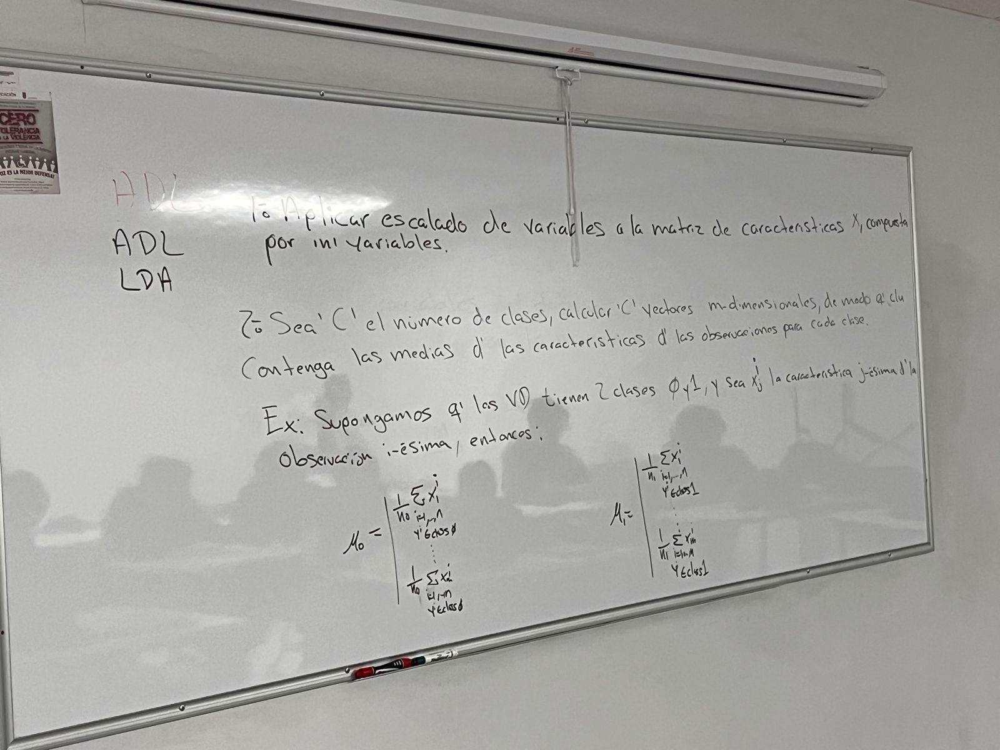


3.- Calculamos la matriz de productos cruzados centrados en la media pura cada clase, que mide la varianza dentro de cada clase

    Con el ejemplo de clases de 0 y 1, las dos matrices de productos cruzados S0 Y S1, C0 y C1

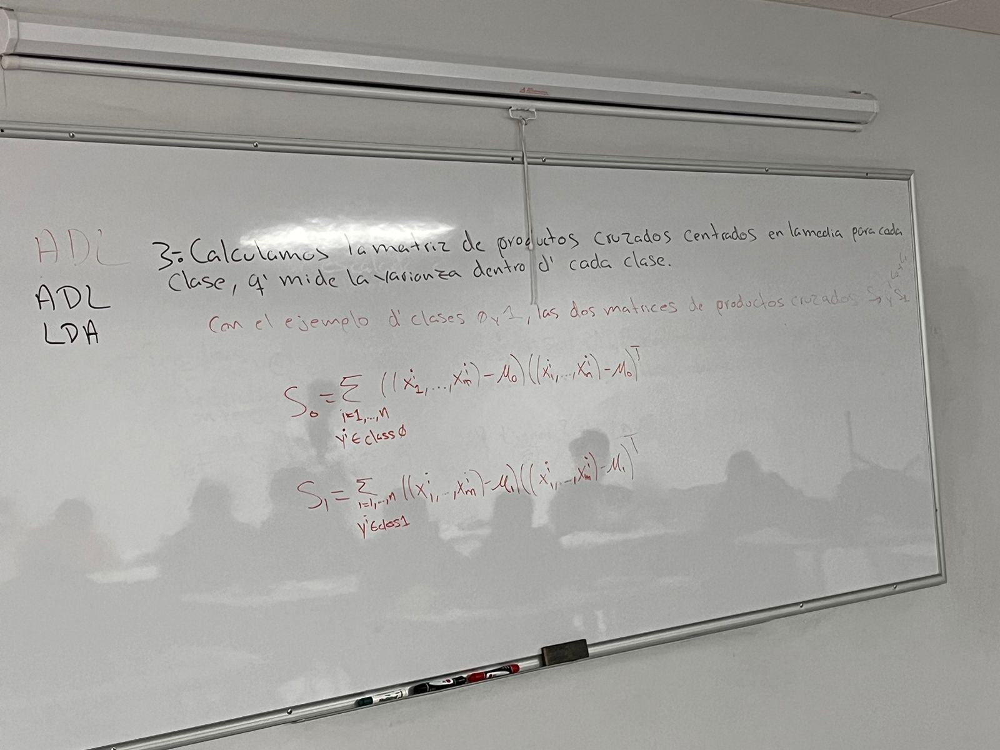

4.- Calculamos la covarianza normalizada de todas las matrices anteriores, W

5.- Calculamos la matriz de covarianza global / clases, B 

6.- Calculamos los valores y vectores propios de la matriz W^-1 * B

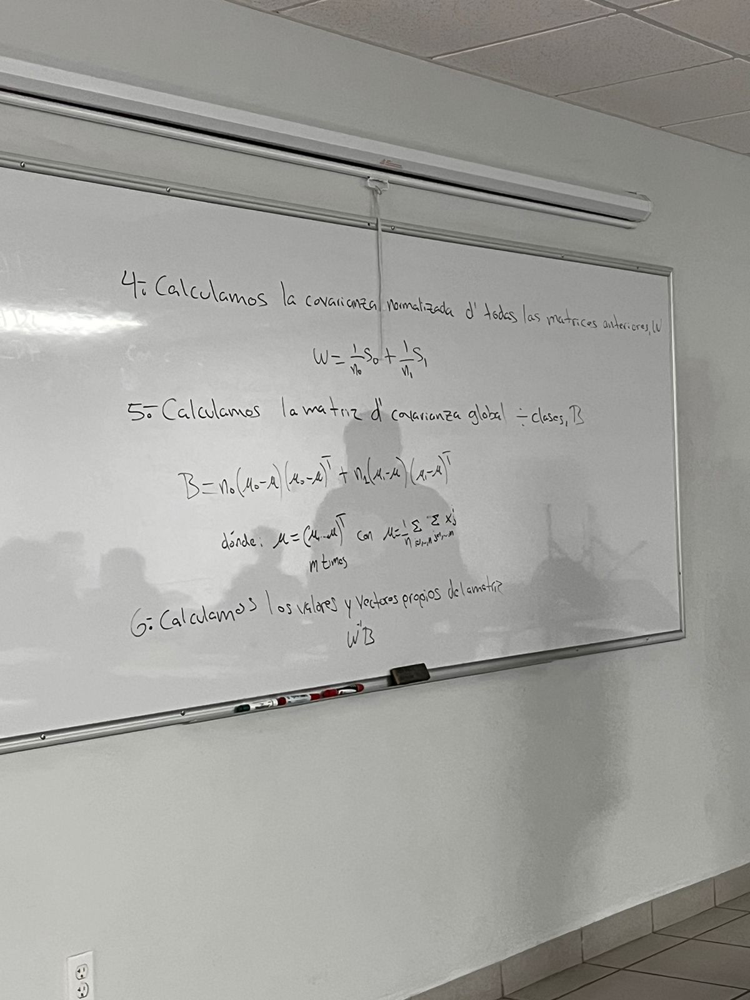

7.- Se eligen los 'p' vectores propios mas grandes como el # dimensiones reducidas

8.- Los 'p' vectores propios asociados a los 'p' valores propios mas grandes son los D.L.

    El espacio m-dimensional del dataset original se proyecta al nuevo subespacio p-dimensional de caracteristicas, aplicando la matriz de proyecciones (que tiene los 'p' vecotes propios por columnas)

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [3]:
dataset = pd.read_csv('../../DataSets/Wine.csv')
dataset

,Alcohol,Malic_Acid,Ash,Ash_Alcanity,Magnesium,Total_Phenols,Flavanoids,Nonflavanoid_Phenols,Proanthocyanins,Color_Intensity,Hue,OD280,Proline,Customer_Segment
0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065,1
1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050,1
2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185,1
3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480,1
4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,13.71,5.65,2.45,20.5,95,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740,3
174,13.40,3.91,2.48,23.0,102,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750,3
175,13.27,4.28,2.26,20.0,120,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835,3
176,13.17,2.59,2.37,20.0,120,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840,3


In [4]:
# Define x and y
X = dataset.iloc[:, :-1].values
y = dataset.iloc[:, -1].values

In [5]:
from sklearn.model_selection import train_test_split

In [6]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .20, random_state = 0)

In [7]:
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()

X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)


In [8]:
X_train

array([[ 0.87668336,  0.79842885,  0.64412971, ...,  0.0290166 ,
        -1.06412236, -0.2059076 ],
       [-0.36659076, -0.7581304 , -0.39779858, ...,  0.0290166 ,
        -0.73083231, -0.81704676],
       [-1.69689407, -0.34424759, -0.32337513, ...,  0.90197362,
         0.51900537, -1.31256499],
       ...,
       [-0.70227477, -0.68615078, -0.65828065, ...,  0.46549511,
         0.51900537, -1.31256499],
       [ 1.13777093, -0.62316862, -0.91876272, ..., -0.18922266,
         1.03282752,  0.80164614],
       [ 1.4610222 ,  0.12361993,  0.42085937, ..., -1.45501034,
        -1.2168803 , -0.2719767 ]])

In [23]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
# El profe de las 14-d quiere solo 2-d
lda = LDA(n_components = 2)

X_train = lda.fit_transform(X_train, y_train)
X_test = lda.transform(X_test)
x_train

array([[ 1.0264442 ,  0.87590291],
       [ 0.24554274, -0.93984685],
       [ 0.17860344, -1.3825025 ],
       [ 1.38113335,  0.90578821],
       [-1.10826326,  0.06766031],
       [-1.03259142,  0.5641425 ],
       [-0.15447099, -1.39285244],
       [ 0.01165889, -1.11649774],
       [ 0.28679248, -1.52134763],
       [-1.07464765,  0.87962882],
       [ 1.08021936,  0.3707607 ],
       [-0.0433955 , -0.84340452],
       [ 1.04209255,  0.92755403],
       [-1.13248604,  1.26554916],
       [ 0.95782644,  0.33239439],
       [ 1.1209296 ,  0.46624249],
       [-1.02219244,  0.08479678],
       [ 1.61780812,  1.08585211],
       [-1.59782011,  0.38687181],
       [ 0.0669219 , -1.78150114],
       [ 1.44535323,  1.4596074 ],
       [ 1.01364968,  0.42709997],
       [-0.33844372, -0.9809825 ],
       [ 1.02933001,  0.30674994],
       [ 1.49852006,  1.08841066],
       [-0.86653009,  0.56165913],
       [ 0.534827  , -0.21437179],
       [ 1.13129853, -0.09950275],
       [-0.31128762,

In [25]:
from sklearn.linear_model import LogisticRegression
clasiffier = LogisticRegression(random_state=0)
clasiffier.fit(X_train, y_train)

LogisticRegression(random_state=0)

In [27]:
from sklearn.metrics import confusion_matrix, accuracy_score

y_pred = clasiffier.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
print(cm)
acc = accuracy_score(y_test, y_pred)
print(acc)

[[14  0  0]
 [ 0 16  0]
 [ 0  0  6]]
1.0


Visualizing Train results

C:\Users\MrJel\AppData\Local\Temp\ipykernel_12100\113556856.py:11: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_set[y_set == j, 0], X_set[y_set == j, 1],


<function matplotlib.pyplot.show(close=None, block=None)>

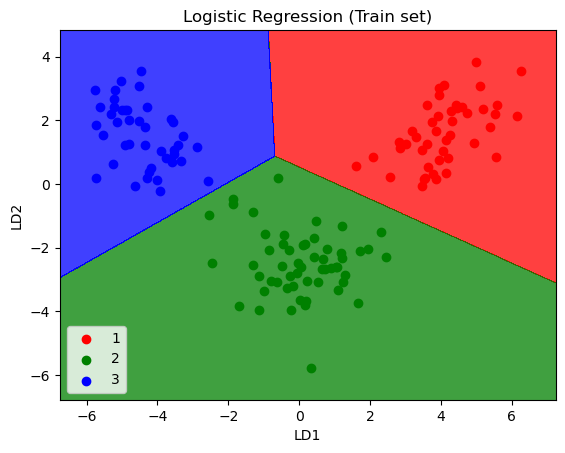

In [37]:
from matplotlib.colors import ListedColormap
X_set, y_set = X_train, y_train
X1,X2 = np.meshgrid(np.arange(start = X_set[:,0].min() - 1, stop = X_set[:,0].max() + 1, step = 0.01),
                    np.arange(start = X_set[:,1].min() - 1, stop = X_set[:,1].max() + 1, step = 0.01))
plt.contourf(X1,X2, clasiffier.predict(np.array([X1.ravel(),X2.ravel()]).T).reshape(X1.shape),
             alpha = 0.75, cmap = ListedColormap(('red','green','blue')))
plt.xlim(X1.min(),X1.max())
plt.ylim(X2.min(),X2.max())

for i, j in enumerate(np.unique(y_set)):
  plt.scatter(X_set[y_set == j, 0], X_set[y_set == j, 1],
              c = ListedColormap(('red','green','blue'))(i), label = j)

plt.title('Logistic Regression (Train set)')
plt.xlabel('LD1')
plt.ylabel('LD2')
plt.legend()
plt.show

C:\Users\MrJel\AppData\Local\Temp\ipykernel_12100\1461379381.py:11: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_set[y_set == j, 0], X_set[y_set == j, 1],


<function matplotlib.pyplot.show(close=None, block=None)>

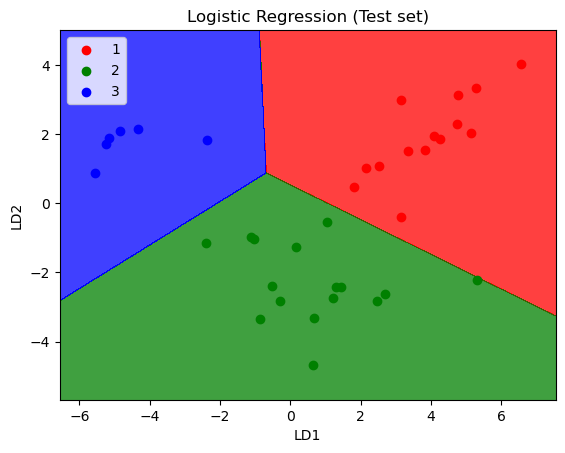

In [34]:
from matplotlib.colors import ListedColormap
X_set, y_set = X_test, y_test
X1,X2 = np.meshgrid(np.arange(start = X_set[:,0].min() - 1, stop = X_set[:,0].max() + 1, step = 0.01),
                    np.arange(start = X_set[:,1].min() - 1, stop = X_set[:,1].max() + 1, step = 0.01))
plt.contourf(X1,X2,clasiffier.predict(np.array([X1.ravel(),X2.ravel()]).T).reshape(X1.shape),
             alpha = 0.75, cmap = ListedColormap(('red','green','blue')))
plt.xlim(X1.min(),X1.max())
plt.ylim(X2.min(),X2.max())

for i, j in enumerate(np.unique(y_set)):
  plt.scatter(X_set[y_set == j, 0], X_set[y_set == j, 1],
              c = ListedColormap(('red','green','blue'))(i), label = j)

plt.title('Logistic Regression (Test set)')
plt.xlabel('LD1')
plt.ylabel('LD2')
plt.legend()
plt.show